## Downloasing Data from Kaggle

In [2]:
!pip install -q opendatasets

In [4]:
from opendatasets import download

dataset_url = 'https://www.kaggle.com/datasets/mohamedmustafa/real-life-violence-situations-dataset/data'
download(dataset_url)


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: pixousamaltom
Your Kaggle Key: ··········


100%|██████████| 3.58G/3.58G [02:43<00:00, 23.5MB/s]


# Preprocessing

In [ ]:
import cv2
import numpy as np


# Function to apply CLAHE to a single frame
def apply_clahe(frame):
    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(gray)

    # Merge the processed channel with the original color channels
    clahe_colored = cv2.merge([clahe_img] * 3)

    return clahe_colored

# Function to apply Adaptive Concave Hull to a single frame
def apply_adaptive_concave_hull(frame):
    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply edge detection (you can choose a different method based on your requirements)
    edges = cv2.Canny(gray, 50, 150)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image
    mask = np.zeros_like(gray)

    # Draw contours on the black image
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)

    # Bitwise AND with the original frame to get the concave hull effect
    result = cv2.bitwise_and(frame, frame, mask=mask)

    return result

In [ ]:
#!rm -r /content/processed_videos

In [ ]:
#New code for batch processing
import os
import cv2
from tqdm.auto import tqdm

def load_and_preprocess_data(video_path, target_size=(224, 224), num_frames=50):
    frames = []
    cap = cv2.VideoCapture(video_path)

    # Read the last 50 frames
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    start_frame = max(total_frames - num_frames, 0)

    for frame_num in range(start_frame, total_frames):
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, target_size)

        # Apply CLAHE and Adaptive Concave Hull
        processed_frame = apply_adaptive_concave_hull(apply_clahe(frame))

        frames.append(processed_frame)

    cap.release()
    return np.array(frames)

def process_directory(directory_path, output_directory, num_videos_per_class=50, num_frames_per_video=50, target_size=(224, 224)):
    video_paths = []
    labels = []

    class_dir = os.path.basename(directory_path)
    output_class_dir = os.path.join(output_directory, class_dir)

    os.makedirs(output_class_dir, exist_ok=True)

    video_files = sorted(os.listdir(directory_path))
    video_files = video_files[:num_videos_per_class]

    for video_file in tqdm(video_files, desc=f"Processing videos in {class_dir}"):
        video_path = os.path.join(directory_path, video_file)
        frames = load_and_preprocess_data(video_path, target_size=target_size, num_frames=num_frames_per_video)

        if frames is not None:
            # Save processed frames to the output directory
            output_video_path = os.path.join(output_class_dir, f"processed_{video_file}")
            save_frames(frames, output_video_path)

            # Append the path and label for each video
            video_paths.append(output_video_path)
            labels.append(class_dir)  # Use the directory name as the label

    return video_paths, labels

def save_frames(frames, output_video_path):
    # Create a VideoWriter object to save the processed video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    height, width, _ = frames[0].shape
    output_video = cv2.VideoWriter(output_video_path, fourcc, 20.0, (width, height))

    # Write the processed frames to the output video
    for frame in frames:
        output_video.write(frame)

    output_video.release()

# Example usage:
input_directory = '/content/real-life-violence-situations-dataset/Real Life Violence Dataset'
output_directory = '/content/processed_videos'

# Process Violence directory
violence_paths, violence_labels = process_directory(os.path.join(input_directory, 'Violence'), output_directory)

# Process NonViolence directory
nonviolence_paths, nonviolence_labels = process_directory(os.path.join(input_directory, 'NonViolence'), output_directory)

Processing videos in Violence:   0%|          | 0/50 [00:00<?, ?it/s]

Processing videos in NonViolence:   0%|          | 0/50 [00:00<?, ?it/s]

# Pose Detection

## Visualization libraries & Imports

In [ ]:
!pip install -q imageio
!pip install -q opencv-python
!pip install -q git+https://github.com/tensorflow/docs

  Preparing metadata (setup.py) ... done


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed
import numpy as np
import cv2

# Import matplotlib libraries
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.patches as patches

# Some modules to display an animation using imageio.
import imageio
from IPython.display import HTML, display

Helper Function

In [ ]:

# Dictionary that maps from joint names to keypoint indices.
KEYPOINT_DICT = {
    'nose': 0,
    'left_eye': 1,
    'right_eye': 2,
    'left_ear': 3,
    'right_ear': 4,
    'left_shoulder': 5,
    'right_shoulder': 6,
    'left_elbow': 7,
    'right_elbow': 8,
    'left_wrist': 9,
    'right_wrist': 10,
    'left_hip': 11,
    'right_hip': 12,
    'left_knee': 13,
    'right_knee': 14,
    'left_ankle': 15,
    'right_ankle': 16
}

# Maps bones to a matplotlib color name.
KEYPOINT_EDGE_INDS_TO_COLOR = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

def _keypoints_and_edges_for_display(keypoints_with_scores,
                                     height,
                                     width,
                                     keypoint_threshold=0.11):

  keypoints_all = []
  keypoint_edges_all = []
  edge_colors = []
  num_instances, _, _, _ = keypoints_with_scores.shape
  for idx in range(num_instances):
    kpts_x = keypoints_with_scores[0, idx, :, 1]
    kpts_y = keypoints_with_scores[0, idx, :, 0]
    kpts_scores = keypoints_with_scores[0, idx, :, 2]
    kpts_absolute_xy = np.stack(
        [width * np.array(kpts_x), height * np.array(kpts_y)], axis=-1)
    kpts_above_thresh_absolute = kpts_absolute_xy[
        kpts_scores > keypoint_threshold, :]
    keypoints_all.append(kpts_above_thresh_absolute)

    for edge_pair, color in KEYPOINT_EDGE_INDS_TO_COLOR.items():
      if (kpts_scores[edge_pair[0]] > keypoint_threshold and
          kpts_scores[edge_pair[1]] > keypoint_threshold):
        x_start = kpts_absolute_xy[edge_pair[0], 0]
        y_start = kpts_absolute_xy[edge_pair[0], 1]
        x_end = kpts_absolute_xy[edge_pair[1], 0]
        y_end = kpts_absolute_xy[edge_pair[1], 1]
        line_seg = np.array([[x_start, y_start], [x_end, y_end]])
        keypoint_edges_all.append(line_seg)
        edge_colors.append(color)
  if keypoints_all:
    keypoints_xy = np.concatenate(keypoints_all, axis=0)
  else:
    keypoints_xy = np.zeros((0, 17, 2))

  if keypoint_edges_all:
    edges_xy = np.stack(keypoint_edges_all, axis=0)
  else:
    edges_xy = np.zeros((0, 2, 2))
  return keypoints_xy, edges_xy, edge_colors


def draw_prediction_on_image(
    image, keypoints_with_scores, crop_region=None, close_figure=False,
    output_image_height=None):

  height, width, channel = image.shape
  aspect_ratio = float(width) / height
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  # To remove the huge white borders
  fig.tight_layout(pad=0)
  ax.margins(0)
  ax.set_yticklabels([])
  ax.set_xticklabels([])
  plt.axis('off')

  im = ax.imshow(image)
  line_segments = LineCollection([], linewidths=(4), linestyle='solid')
  ax.add_collection(line_segments)
  # Turn off tick labels
  scat = ax.scatter([], [], s=60, color='#FF1493', zorder=3)

  (keypoint_locs, keypoint_edges,
   edge_colors) = _keypoints_and_edges_for_display(
       keypoints_with_scores, height, width)

  line_segments.set_segments(keypoint_edges)
  line_segments.set_color(edge_colors)
  if keypoint_edges.shape[0]:
    line_segments.set_segments(keypoint_edges)
    line_segments.set_color(edge_colors)
  if keypoint_locs.shape[0]:
    scat.set_offsets(keypoint_locs)

  if crop_region is not None:
    xmin = max(crop_region['x_min'] * width, 0.0)
    ymin = max(crop_region['y_min'] * height, 0.0)
    rec_width = min(crop_region['x_max'], 0.99) * width - xmin
    rec_height = min(crop_region['y_max'], 0.99) * height - ymin
    rect = patches.Rectangle(
        (xmin,ymin),rec_width,rec_height,
        linewidth=1,edgecolor='b',facecolor='none')
    ax.add_patch(rect)

  fig.canvas.draw()
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
  image_from_plot = image_from_plot.reshape(
      fig.canvas.get_width_height()[::-1] + (3,))
  plt.close(fig)
  if output_image_height is not None:
    output_image_width = int(output_image_height / height * width)
    image_from_plot = cv2.resize(
        image_from_plot, dsize=(output_image_width, output_image_height),
         interpolation=cv2.INTER_CUBIC)
  return image_from_plot

def to_gif(images, duration):
  imageio.mimsave('./animation.gif', images, duration=duration)
  return embed.embed_file('./animation.gif')

def progress(value, max=100):
  return HTML("""
      <progress
          value='{value}'
          max='{max}',
          style='width: 100%'
      >
          {value}
      </progress>
  """.format(value=value, max=max))

## Load Model from TF hub

In [ ]:
#New
model_name = "movenet_lightning"

if "tflite" in model_name:
  if "movenet_lightning_f16" in model_name:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/lightning/tflite/float16/4?lite-format=tflite
    input_size = 192
  elif "movenet_thunder_f16" in model_name:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
    input_size = 256
  elif "movenet_lightning_int8" in model_name:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/lightning/tflite/int8/4?lite-format=tflite
    input_size = 192
  elif "movenet_thunder_int8" in model_name:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/int8/4?lite-format=tflite
    input_size = 256
  else:
    raise ValueError("Unsupported model name: %s" % model_name)

  # Initialize the TFLite interpreter
  interpreter = tf.lite.Interpreter(model_path="model.tflite")
  interpreter.allocate_tensors()

  def movenet(input_image):

    # TF Lite format expects tensor type of uint8.
    input_image = tf.cast(input_image, dtype=tf.uint8)
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    interpreter.set_tensor(input_details[0]['index'], input_image.numpy())
    # Invoke inference.
    interpreter.invoke()
    # Get the model prediction.
    keypoints_with_scores = interpreter.get_tensor(output_details[0]['index'])
    return keypoints_with_scores

else:
  if "movenet_lightning" in model_name:
    module = hub.load("https://tfhub.dev/google/movenet/singlepose/lightning/4")
    input_size = 192
  elif "movenet_thunder" in model_name:
    module = hub.load("https://tfhub.dev/google/movenet/singlepose/thunder/4")
    input_size = 256
  else:
    raise ValueError("Unsupported model name: %s" % model_name)

  def movenet(input_image):

    model = module.signatures['serving_default']

    # SavedModel format expects tensor type of int32.
    input_image = tf.cast(input_image, dtype=tf.int32)
    # Run model inference.
    outputs = model(input_image)
    # Output is a [1, 1, 17, 3] tensor.
    keypoints_with_scores = outputs['output_0'].numpy()
    return keypoints_with_scores

In [ ]:
# Load the input image.
image_path = '/content/output_animation.gif'
image = tf.io.read_file(image_path)
image = tf.image.decode_gif(image)


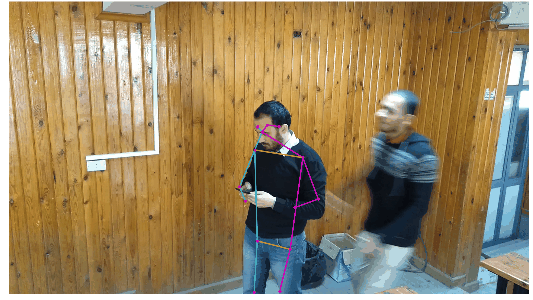

In [ ]:
# Load the input image.
num_frames, image_height, image_width, _ = image.shape
crop_region = init_crop_region(image_height, image_width)

output_images = []
bar = display(progress(0, num_frames-1), display_id=True)
for frame_idx in range(num_frames):
  keypoints_with_scores = run_inference(
      movenet, image[frame_idx, :, :, :], crop_region,
      crop_size=[input_size, input_size])
  output_images.append(draw_prediction_on_image(
      image[frame_idx, :, :, :].numpy().astype(np.int32),
      keypoints_with_scores, crop_region=None,
      close_figure=True, output_image_height=300))
  crop_region = determine_crop_region(
      keypoints_with_scores, image_height, image_width)
  bar.update(progress(frame_idx, num_frames-1))

# Prepare gif visualization.
output = np.stack(output_images, axis=0)
to_gif(output, duration=100)

In [ ]:
# Get input details
input_details = interpreter.get_input_details()

# Print input shape
input_shape = input_details[0]['shape']
print("Input Shape:", input_shape)


Input Shape: [1 1 1 3]


## Cropping Algorithm

In [ ]:
# Confidence score to determine whether a keypoint prediction is reliable.
MIN_CROP_KEYPOINT_SCORE = 0.2

def init_crop_region(image_height, image_width):

  if image_width > image_height:
    box_height = image_width / image_height
    box_width = 1.0
    y_min = (image_height / 2 - image_width / 2) / image_height
    x_min = 0.0
  else:
    box_height = 1.0
    box_width = image_height / image_width
    y_min = 0.0
    x_min = (image_width / 2 - image_height / 2) / image_width

  return {
    'y_min': y_min,
    'x_min': x_min,
    'y_max': y_min + box_height,
    'x_max': x_min + box_width,
    'height': box_height,
    'width': box_width
  }

def torso_visible(keypoints):

  return ((keypoints[0, 0, KEYPOINT_DICT['left_hip'], 2] >
           MIN_CROP_KEYPOINT_SCORE or
          keypoints[0, 0, KEYPOINT_DICT['right_hip'], 2] >
           MIN_CROP_KEYPOINT_SCORE) and
          (keypoints[0, 0, KEYPOINT_DICT['left_shoulder'], 2] >
           MIN_CROP_KEYPOINT_SCORE or
          keypoints[0, 0, KEYPOINT_DICT['right_shoulder'], 2] >
           MIN_CROP_KEYPOINT_SCORE))

def determine_torso_and_body_range(
    keypoints, target_keypoints, center_y, center_x):

  torso_joints = ['left_shoulder', 'right_shoulder', 'left_hip', 'right_hip']
  max_torso_yrange = 0.0
  max_torso_xrange = 0.0
  for joint in torso_joints:
    dist_y = abs(center_y - target_keypoints[joint][0])
    dist_x = abs(center_x - target_keypoints[joint][1])
    if dist_y > max_torso_yrange:
      max_torso_yrange = dist_y
    if dist_x > max_torso_xrange:
      max_torso_xrange = dist_x

  max_body_yrange = 0.0
  max_body_xrange = 0.0
  for joint in KEYPOINT_DICT.keys():
    if keypoints[0, 0, KEYPOINT_DICT[joint], 2] < MIN_CROP_KEYPOINT_SCORE:
      continue
    dist_y = abs(center_y - target_keypoints[joint][0]);
    dist_x = abs(center_x - target_keypoints[joint][1]);
    if dist_y > max_body_yrange:
      max_body_yrange = dist_y

    if dist_x > max_body_xrange:
      max_body_xrange = dist_x

  return [max_torso_yrange, max_torso_xrange, max_body_yrange, max_body_xrange]

def determine_crop_region(
      keypoints, image_height,
      image_width):

  target_keypoints = {}
  for joint in KEYPOINT_DICT.keys():
    target_keypoints[joint] = [
      keypoints[0, 0, KEYPOINT_DICT[joint], 0] * image_height,
      keypoints[0, 0, KEYPOINT_DICT[joint], 1] * image_width
    ]

  if torso_visible(keypoints):
    center_y = (target_keypoints['left_hip'][0] +
                target_keypoints['right_hip'][0]) / 2;
    center_x = (target_keypoints['left_hip'][1] +
                target_keypoints['right_hip'][1]) / 2;

    (max_torso_yrange, max_torso_xrange,
      max_body_yrange, max_body_xrange) = determine_torso_and_body_range(
          keypoints, target_keypoints, center_y, center_x)

    crop_length_half = np.amax(
        [max_torso_xrange * 1.9, max_torso_yrange * 1.9,
          max_body_yrange * 1.2, max_body_xrange * 1.2])

    tmp = np.array(
        [center_x, image_width - center_x, center_y, image_height - center_y])
    crop_length_half = np.amin(
        [crop_length_half, np.amax(tmp)]);

    crop_corner = [center_y - crop_length_half, center_x - crop_length_half];

    if crop_length_half > max(image_width, image_height) / 2:
      return init_crop_region(image_height, image_width)
    else:
      crop_length = crop_length_half * 2;
      return {
        'y_min': crop_corner[0] / image_height,
        'x_min': crop_corner[1] / image_width,
        'y_max': (crop_corner[0] + crop_length) / image_height,
        'x_max': (crop_corner[1] + crop_length) / image_width,
        'height': (crop_corner[0] + crop_length) / image_height -
            crop_corner[0] / image_height,
        'width': (crop_corner[1] + crop_length) / image_width -
            crop_corner[1] / image_width
      }
  else:
    return init_crop_region(image_height, image_width)

def crop_and_resize(image, crop_region, crop_size):
  """Crops and resize the image to prepare for the model input."""
  boxes=[[crop_region['y_min'], crop_region['x_min'],
          crop_region['y_max'], crop_region['x_max']]]
  output_image = tf.image.crop_and_resize(
      image, box_indices=[0], boxes=boxes, crop_size=crop_size)
  return output_image

def run_inference(movenet, image, crop_region, crop_size):

  image_height, image_width, _ = image.shape
  input_image = crop_and_resize(
    tf.expand_dims(image, axis=0), crop_region, crop_size=crop_size)
  # Run model inference.
  keypoints_with_scores = movenet(input_image)
  # Update the coordinates.
  for idx in range(17):
    keypoints_with_scores[0, 0, idx, 0] = (
        crop_region['y_min'] * image_height +
        crop_region['height'] * image_height *
        keypoints_with_scores[0, 0, idx, 0]) / image_height
    keypoints_with_scores[0, 0, idx, 1] = (
        crop_region['x_min'] * image_width +
        crop_region['width'] * image_width *
        keypoints_with_scores[0, 0, idx, 1]) / image_width
  return keypoints_with_scores

### Load Input Image Sequence

In [ ]:
import imageio

# Specify the input and output file paths
input_file_path = '/content/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_1.mp4'
output_file_path = 'output_animation.gif'

# Read the input video and convert it to a GIF
video = imageio.get_reader(input_file_path)
fps = video.get_meta_data()['fps']

with imageio.get_writer(output_file_path, fps=fps) as gif_writer:
    for frame in video:
        gif_writer.append_data(frame)


In [ ]:
# Load the input image.
image_path = '/content/output_animation.gif'
image = tf.io.read_file(image_path)
image = tf.image.decode_gif(image)

In [ ]:
image.shape

TensorShape([103, 1080, 1920, 3])

# Classification


In [ ]:
import random
import pathlib
import itertools
import collections

import os
import cv2
import numpy as np

import tensorflow as tf
from tqdm.auto import tqdm

import imageio
from IPython import display
from urllib import request

import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

In [ ]:
class_mapping = {"NonViolence": 0, "Violence": 1}  # Adjust the class names accordingly

In [ ]:
#new sample limmiter
def load_video_paths_and_labels(data_dir, class_mapping, max_samples_per_class=100):
    video_paths = []
    labels = []
    class_dirs = sorted(os.listdir(data_dir))
    for i, class_dir in enumerate(class_dirs):
        class_path = os.path.join(data_dir, class_dir)
        video_files = sorted(os.listdir(class_path))

        # Limit the number of samples for each class
        video_files = video_files[:max_samples_per_class]

        video_paths += [os.path.join(class_path, video_file) for video_file in video_files]
        labels += [class_mapping[class_dir]] * len(video_files)
    return video_paths, labels


In [ ]:
def preprocess_video(video_path, num_frames=30, target_size=(224, 224)):
    # Function to load and preprocess even-numbered frames from the last frame of a video file
    frames = []
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Ensure we have at least num_frames frames
    total_frames = max(num_frames * 2, total_frames)

    # Set the starting frame index to take the last frame
    start_frame = max(0, total_frames - 1)

    for frame_idx in range(start_frame, 0, -2):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, target_size)
        frames.insert(0, frame)

    cap.release()

    # If the video has fewer frames than num_frames, repeat the first frame to fill the gap
    while len(frames) < num_frames:
        frames.insert(0, frames[0])

    # If the video has more frames than num_frames, trim the frames
    frames = frames[:num_frames]

    return np.array(frames)


In [ ]:
def data_generator(video_paths, labels, batch_size=32, num_frames=30, target_size=(224, 224)):
    def generator():
        for i in range(0, len(video_paths), batch_size):
            batch_video_paths = video_paths[i:i + batch_size]
            batch_labels = labels[i:i + batch_size]

            # If labels are strings, convert to numerical labels
            if isinstance(batch_labels[0], str):
                batch_labels = [class_mapping[label] for label in batch_labels]

            batch_frames = [preprocess_video(video_path, num_frames=num_frames, target_size=target_size)
                            for video_path in batch_video_paths]

            # Convert to numpy array
            batch_frames_np = np.stack(batch_frames)
            batch_labels_np = np.array(batch_labels)

            # print(f"Batch Shape - Frames: {batch_frames_np.shape}, Labels: {batch_labels_np.shape}")

            # Display some sample images
            # print("Sample Images:")
            for sample_index in range(min(3, batch_size)):  # Display up to 3 samples
                sample_image = batch_frames_np[sample_index, 0]  # Display the first frame of each sample
                # print(f"Sample {sample_index + 1}, Label: {batch_labels_np[sample_index]}")

                # # Display the sample image using Matplotlib
                # plt.figure()
                # plt.imshow(sample_image.astype(np.uint8))
                # plt.title(f"Sample {sample_index + 1}")
                # plt.show()

            yield batch_frames_np, batch_labels_np

    return tf.data.Dataset.from_generator(generator, output_signature=(
        tf.TensorSpec(shape=(batch_size, num_frames, target_size[0], target_size[1], 3), dtype=tf.float32),
        tf.TensorSpec(shape=(batch_size,), dtype=tf.int32)  # Change dtype to tf.int32
    ))


In [ ]:
from sklearn.model_selection import train_test_split

# Define class mapping
class_mapping = {"NonViolence": 0, "Violence": 1}

# Load video paths and labels
max_samples_per_class = 100
video_paths, labels = load_video_paths_and_labels('/content/real-life-violence-situations-dataset/Real Life Violence Dataset', class_mapping, max_samples_per_class)

# Split the data into training and validation sets
train_video_paths, validation_video_paths, train_labels, validation_labels = train_test_split(
    video_paths, labels, test_size=0.2, stratify=labels, random_state=42
)

# Define batch size and other parameters
batch_size = 2
num_frames = 30
target_size = (224, 224)

# Create training and validation datasets
train_dataset = data_generator(train_video_paths, train_labels, batch_size=batch_size, num_frames=num_frames, target_size=target_size)
validation_dataset = data_generator(validation_video_paths, validation_labels, batch_size=batch_size, num_frames=num_frames, target_size=target_size)


## Ladder Model

In [ ]:
def ladder_network(input_shape=(30, 224, 224, 3), num_classes=2):
    # Encoder using DenseNet201 for individual frames
    frame_input_shape = (224, 224, 3)
    base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=frame_input_shape)
    for layer in base_model.layers:
        layer.trainable = False

    # Input for the entire video sequence
    input_layer = Input(shape=input_shape)

    # Process each frame independently using DenseNet201
    frames = [base_model(frame) for frame in tf.unstack(input_layer, axis=1)]

    # Decoder
    decoder_output = GlobalAveragePooling2D()(frames[-1])
    decoder_output = Dense(512, activation='relu')(decoder_output)
    decoder_output = BatchNormalization()(decoder_output)
    decoder_output = Dense(256, activation='relu')(decoder_output)
    decoder_output = BatchNormalization()(decoder_output)
    decoder_output = Dense(128, activation='relu')(decoder_output)
    decoder_output = BatchNormalization()(decoder_output)

    # Classifier
    classifier_output = Flatten()(frames[-1])
    classifier_output = Dense(256, activation='relu')(classifier_output)
    classifier_output = BatchNormalization()(classifier_output)
    classifier_output = Dense(128, activation='relu')(classifier_output)
    classifier_output = BatchNormalization()(classifier_output)
    classifier_output = Dense(num_classes, activation='softmax')(classifier_output)

    # Ladder Network - Concatenate decoder and classifier outputs
    ladder_output = concatenate([decoder_output, classifier_output])

    # Final model
    ladder_model = Model(inputs=input_layer, outputs=ladder_output)
    ladder_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return ladder_model


In [ ]:

# Create the ladder network model
input_shape = (num_frames, target_size[0], target_size[1], 3)
num_classes = len(class_mapping)
model = ladder_network(input_shape=input_shape, num_classes=num_classes)

In [ ]:
# Train the model
epochs = 4
model.fit(train_dataset, epochs=epochs, validation_data=validation_dataset)

Epoch 1/4
20/20 [==============================] - 1143s 56s/step - loss: 12.1274 - accuracy: 0.0250 - val_loss: 12.3387 - val_accuracy: 0.0000e+00
Epoch 2/4
20/20 [==============================] - 1083s 54s/step - loss: 9.7489 - accuracy: 0.0125 - val_loss: 13.1372 - val_accuracy: 0.0000e+00
Epoch 3/4
20/20 [==============================] - 1034s 52s/step - loss: 7.6729 - accuracy: 0.1312 - val_loss: 14.7514 - val_accuracy: 0.0000e+00
Epoch 4/4
20/20 [==============================] - 1077s 54s/step - loss: 6.6121 - accuracy: 0.3625 - val_loss: 10.7305 - val_accuracy: 0.0000e+00


In [ ]:

# Save the trained model if needed
model.save('/content/model.h5')




---



---



## Movinet Model

In [ ]:
!pip install -q tf_models-official

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.3/106.3 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 26.7 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from official.projects.movinet.modeling import movinet
from official.projects.movinet.modeling import movinet_model

# Set the number of classes in your dataset
num_classes = 2  # Adjust this to match the number of classes in your dataset

# Load the Movinet backbone
backbone = movinet.Movinet(model_id='a0')
backbone.trainable = True  # You can choose whether to train the backbone or not

# Create the MovinetClassifier model with the modified number of classes
model = movinet_model.MovinetClassifier(backbone=backbone, num_classes=num_classes)
model.build([None, None, None, None, 3])  # Input shape based on your video frames

# Print model summary
model.summary()


Model: "movinet_classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image (InputLayer)          [(None, None, None, Non   0         
                             e, 3)]                              
                                                                 
 movinet (Movinet)           ({'stem': (None, None,    911583    
                             None, None, 8),                     
                              'block0_layer0': (None             
                             , None, None, None, 8),             
                              'block1_layer0': (None             
                             , None, None, None, 32)             
                             , 'block1_layer1': (Non             
                             e, None, None, None, 32             
                             ),                                  
                              'block1_layer2': (

In [ ]:
# Choose an optimizer, loss function, and metrics
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
metrics = ['accuracy']

# Compile the model
model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming you have already defined the data generation functions and ladder_network function

# Define class mapping
class_mapping = {"NonViolence": 0, "Violence": 1}

# Load video paths and labels
max_samples_per_class = 100
video_paths, labels = load_video_paths_and_labels('/content/real-life-violence-situations-dataset/Real Life Violence Dataset', class_mapping, max_samples_per_class)

# Split the data into training and validation sets
train_video_paths, validation_video_paths, train_labels, validation_labels = train_test_split(
    video_paths, labels, test_size=0.2, stratify=labels, random_state=42
)


In [ ]:
# Train the model
num_epochs = 10

# Define batch size and other parameters
batch_size = 2
num_frames = 30
target_size = (224, 224)

# Create training and validation datasets
train_dataset = data_generator(train_video_paths, train_labels, batch_size=batch_size, num_frames=num_frames, target_size=target_size)
validation_dataset = data_generator(validation_video_paths, validation_labels, batch_size=batch_size, num_frames=num_frames, target_size=target_size)

# Create the ladder network model
input_shape = (num_frames, target_size[0], target_size[1], 3)
num_classes = len(class_mapping)

#model.fit(train_ds, epochs=num_epochs, batch_size=batch_size)
history = model.fit(train_dataset, epochs=num_epochs, validation_data=validation_dataset)

Epoch 1/10
80/80 [==============================] - 909s 11s/step - loss: 0.6839 - accuracy: 0.6438 - val_loss: 0.9591 - val_accuracy: 0.5750
Epoch 2/10
80/80 [==============================] - 859s 11s/step - loss: 0.6080 - accuracy: 0.6812 - val_loss: 0.5238 - val_accuracy: 0.6750
Epoch 3/10
80/80 [==============================] - 861s 11s/step - loss: 0.5291 - accuracy: 0.7063 - val_loss: 0.9810 - val_accuracy: 0.7000
Epoch 4/10
80/80 [==============================] - 853s 11s/step - loss: 0.4423 - accuracy: 0.7688 - val_loss: 0.3937 - val_accuracy: 0.8000
Epoch 5/10
80/80 [==============================] - 858s 11s/step - loss: 0.3766 - accuracy: 0.8188 - val_loss: 0.9232 - val_accuracy: 0.8750
Epoch 6/10
80/80 [==============================] - 849s 11s/step - loss: 0.3143 - accuracy: 0.9000 - val_loss: 0.0522 - val_accuracy: 0.9750
Epoch 7/10
80/80 [==============================] - 862s 11s/step - loss: 0.1726 - accuracy: 0.9312 - val_loss: 0.1650 - val_accuracy: 0.9500
Epoch 

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()




---



---

